In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

In [2]:
import addict
import matplotlib
import warnings

import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

from matplotlib.collections import LineCollection

import colorcet as cc

import celeri

# Read data and pre-process

In [3]:
COMMAND_FILE_NAME = "../data/command/japan_command_cmi_coupling.json"
command = celeri.get_command(COMMAND_FILE_NAME)
celeri.create_output_folder(command)
logger = celeri.get_logger(command)
segment, block, meshes, station, mogi, sar = celeri.read_data(command)
station = celeri.process_station(station, command)
segment = celeri.process_segment(segment, command, meshes)
sar = celeri.process_sar(sar, command)
closure, block = celeri.assign_block_labels(segment, station, block, mogi, sar)
assembly = addict.Dict()
operators = addict.Dict()
operators.meshes = [addict.Dict()] * len(meshes)
assembly = celeri.merge_geodetic_data(assembly, station, sar)

INFO: Read: ../data/command/japan_command_cmi_coupling.json - celeri.celeri:get_logger:7560 - 2024-11-25 15:32:48
INFO: RUN_NAME: 0000000650 - celeri.celeri:get_logger:7561 - 2024-11-25 15:32:48
INFO: Write log file: ../runs/0000000650/0000000650.log - celeri.celeri:get_logger:7562 - 2024-11-25 15:32:48
INFO: Reading data files - celeri.celeri:read_data:451 - 2024-11-25 15:32:48
SUCCESS: Read: ../data/segment/qp_japan_segment.csv - celeri.celeri:read_data:455 - 2024-11-25 15:32:48
SUCCESS: Read: ../data/block/japan_block.csv - celeri.celeri:read_data:460 - 2024-11-25 15:32:48
SUCCESS: Read: ../data/mesh/japan_mesh_parameters_cmi_coupling.json - celeri.celeri:read_data:467 - 2024-11-25 15:32:48

SUCCESS: Read: ../data/mesh/nankai.msh - celeri.celeri:read_mesh:446 - 2024-11-25 15:32:48

SUCCESS: Read: ../data/mesh/japan.msh - celeri.celeri:read_mesh:446 - 2024-11-25 15:32:48

SUCCESS: Read: ../data/mesh/sagami.msh - celeri.celeri:read_mesh:446 - 2024-11-25 15:32:48

SUCCESS: Read: ../dat

# Generate all operators, weighting, and data vector for KL+QP problem

In [4]:
# Get all elastic operators for segments and TDEs
celeri.get_elastic_operators(operators, meshes, segment, station, command)

# Get TDE smoothing operators
celeri.get_all_mesh_smoothing_matrices(meshes, operators)

# Block rotation to velocity operator
operators.rotation_to_velocities = celeri.get_rotation_to_velocities_partials(
    station, len(block)
)

# Soft block motion constraints
assembly, operators.block_motion_constraints = celeri.get_block_motion_constraints(
    assembly, block, command
)

# Soft slip rate constraints
assembly, operators.slip_rate_constraints = celeri.get_slip_rate_constraints(
    assembly, segment, block, command
)

# Rotation vectors to slip rate operator
operators.rotation_to_slip_rate = celeri.get_rotation_to_slip_rate_partials(
    segment, block
)

# Internal block strain rate operator
(
    operators.block_strain_rate_to_velocities,
    strain_rate_block_index,
) = celeri.get_block_strain_rate_to_velocities_partials(block, station, segment)

# Mogi source operator
operators.mogi_to_velocities = celeri.get_mogi_to_velocities_partials(
    mogi, station, command
)

# Soft TDE boundary condition constraints
celeri.get_tde_slip_rate_constraints(meshes, operators)

# Get index
index = celeri.get_index_eigen(assembly, segment, station, block, meshes, mogi)

# Get data vector for KL problem
data_vector_eigen = celeri.get_data_vector_eigen(meshes, assembly, index)

# Get data vector for KL problem
weighting_vector_eigen = celeri.get_weighting_vector_eigen(
    command, station, meshes, index
)

# Get KL modes for each mesh
celeri.get_eigenvectors_to_tde_slip(operators, meshes)

# Get full operator including all blocks, KL modes, strain blocks, and mogis
operators.eigen = celeri.get_full_dense_operator_eigen(operators, meshes, index)

# Get rotation to TDE kinematic slip rate operator for all meshes tied to segments
celeri.get_tde_coupling_constraints(meshes, segment, block, operators)

INFO: Computing elastic operators - celeri.celeri:get_elastic_operators:2053 - 2024-11-25 15:32:48


Calculating Okada partials for segments: 100%|██████████| 481/481 [00:04<00:00, 113.46it/s]


INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-25 15:32:52


Calculating cutde partials for triangles: 100%|██████████| 1902/1902 [00:05<00:00, 325.18it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-25 15:32:58
INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/japan.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-25 15:32:58


Calculating cutde partials for triangles: 100%|██████████| 2621/2621 [00:07<00:00, 328.41it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/japan.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-25 15:33:06
INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/sagami.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-25 15:33:06


Calculating cutde partials for triangles: 100%|██████████| 231/231 [00:00<00:00, 318.84it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/sagami.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-25 15:33:07
INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/japan_mock_cmi.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-25 15:33:07


Calculating cutde partials for triangles: 100%|██████████| 76/76 [00:00<00:00, 346.25it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/japan_mock_cmi.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-25 15:33:07
INFO: No slip rate constraints - celeri.celeri:get_slip_rate_constraints:3356 - 2024-11-25 15:33:08
INFO: Start: Eigenvectors to TDE slip for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4456 - 2024-11-25 15:33:08
SUCCESS: Finish: Eigenvectors to TDE slip for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4485 - 2024-11-25 15:33:09
INFO: Start: Eigenvectors to TDE slip for mesh: ../data/mesh/japan.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4456 - 2024-11-25 15:33:09
SUCCESS: Finish: Eigenvectors to TDE slip for mesh: ../data/mesh/japan.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4485 - 2024-11-25 15:33:11
INFO: Start: Eigenvectors to TDE slip for mesh: ../data/mesh/sagami.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4456 - 2024-11-25 15:33:11
SUCCESS: Finish: 

# Solve bounded KL+QP problem

In [5]:
# Get QP bounds as inequality constraints
qp_inequality_constraints_matrix, qp_inequality_constraints_data_vector = (
    celeri.get_qp_all_inequality_operator_and_data_vector(
        index, meshes, operators, segment, block
    )
)

# QP solve
opts = {"show_progress": True}
solution_qp = celeri.lsqlin_qp(
    operators.eigen * np.sqrt(weighting_vector_eigen[:, None]),
    data_vector_eigen * np.sqrt(weighting_vector_eigen),
    0,
    qp_inequality_constraints_matrix,  # Inequality matrix
    qp_inequality_constraints_data_vector,  # Inequality data vector
    None,
    None,
    None,
    None,
    None,
    opts,
)


# Create estimation data structure and calculate derived quantities
estimation_qp = addict.Dict()
estimation_qp.state_vector = np.array(solution_qp["x"]).flatten()
estimation_qp.operator = operators.eigen
celeri.post_process_estimation_eigen(estimation_qp, operators, station, index)
celeri.write_output(command, estimation_qp, station, segment, block, meshes)

INFO: No hard slip rate bounds - celeri.celeri:get_slip_rate_bounds:4153 - 2024-11-25 15:33:12
     pcost       dcost       gap    pres   dres
 0: -2.9506e+04 -2.9872e+07  3e+07  5e-17  2e-15
 1: -4.3939e+04 -7.2012e+06  7e+06  2e-16  7e-16
 2: -4.3712e+04 -6.7968e+06  7e+06  3e-16  8e-16
 3: -4.4926e+04 -1.1108e+06  1e+06  2e-16  9e-16
 4: -4.7548e+04 -2.1987e+05  2e+05  2e-16  7e-16
 5: -4.9542e+04 -7.0844e+04  2e+04  2e-16  7e-16
 6: -5.0288e+04 -5.3062e+04  3e+03  2e-16  8e-16
 7: -5.0475e+04 -5.1019e+04  5e+02  3e-16  8e-16
 8: -5.0517e+04 -5.0794e+04  3e+02  3e-16  6e-16
 9: -5.0529e+04 -5.0698e+04  2e+02  3e-16  5e-16
10: -5.0533e+04 -5.0652e+04  1e+02  3e-16  4e-16
11: -5.0536e+04 -5.0591e+04  5e+01  3e-16  5e-16
12: -5.0537e+04 -5.0570e+04  3e+01  3e-16  4e-16
13: -5.0538e+04 -5.0550e+04  1e+01  3e-16  5e-16
14: -5.0538e+04 -5.0544e+04  6e+00  3e-16  6e-16
15: -5.0538e+04 -5.0541e+04  3e+00  3e-16  5e-16
16: -5.0538e+04 -5.0539e+04  7e-01  3e-16  4e-16
17: -5.0538e+04 -5.0538e

# Plot KL+QP estimation

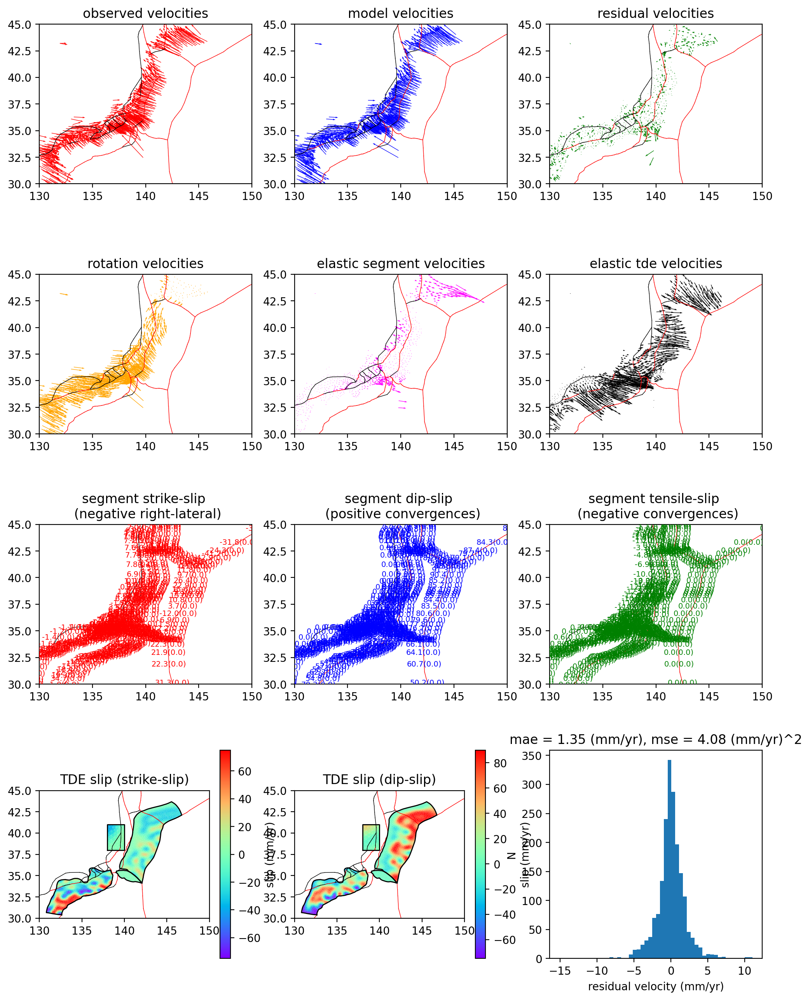

SUCCESS: Wrote figures../runs/0000000650/plot_estimation_summary.(pdf, png) - celeri.celeri:plot_estimation_summary:6601 - 2024-11-25 15:33:17


<Figure size 640x480 with 0 Axes>

In [6]:
celeri.plot_estimation_summary(
    command,
    segment,
    station,
    meshes,
    estimation_qp,
    lon_range=command.lon_range,
    lat_range=command.lat_range,
    quiver_scale=command.quiver_scale,
)

# Helper functions
- mesh plotting
- mesh smoothing

In [7]:
def plot_mesh(meshes, fill_value, ax):
    x_coords = meshes.points[:, 0]
    y_coords = meshes.points[:, 1]
    vertex_array = np.asarray(meshes.verts)

    if not ax:
        ax = plt.gca()
    xy = np.c_[x_coords, y_coords]
    verts = xy[vertex_array]
    pc = matplotlib.collections.PolyCollection(verts, edgecolor="none", cmap="rainbow")
    pc.set_array(fill_value)
    ax.add_collection(pc)
    ax.autoscale()
    plt.colorbar(pc, fraction=0.046, pad=0.04)

    # Add mesh edge
    x_edge = x_coords[meshes.ordered_edge_nodes[:, 0]]
    y_edge = y_coords[meshes.ordered_edge_nodes[:, 0]]
    x_edge = np.append(x_edge, x_coords[meshes.ordered_edge_nodes[0, 0]])
    y_edge = np.append(y_edge, y_coords[meshes.ordered_edge_nodes[0, 0]])
    plt.plot(x_edge, y_edge, color="black", linewidth=1)
    plt.gca().set_aspect("equal")


def smooth_irregular_data(x_coords, y_coords, values, length_scale):
    # Build a KDTree for efficient neighbor searching
    points = np.vstack((x_coords, y_coords)).T
    tree = cKDTree(points)

    # Prepare an array to store the smoothed values
    smoothed_values = np.zeros_like(values)

    # Smoothing calculation
    for i, point in enumerate(points):
        # Find neighbors within 3 * length_scale for efficiency
        indices = tree.query_ball_point(point, 3 * length_scale)

        # Calculate distances and apply Gaussian weights
        distances = np.linalg.norm(points[indices] - point, axis=1)
        weights = np.exp(-(distances**2) / (2 * length_scale**2))

        # Weighted sum for smoothing
        smoothed_values[i] = np.sum(weights * values[indices]) / np.sum(weights)

    return smoothed_values

# Iterative approach to finding a solution within coupling bounds

In [ ]:
def get_coupling(
    x1,
    x2,
    estimated_slip,
    kinematic_slip,
    smoothing_length_scale,
    kinematic_slip_regularization_scale,
):
    """
    Calculate coupling with optional smoothing and regularization
    """

    # Smooth kinematic rates
    if smoothing_length_scale > 0.0:
        kinematic_slip = smooth_irregular_data(
            x1,
            x2,
            kinematic_slip,
            length_scale=smoothing_length_scale,
        )

    # Set the minimum value of the kinematic rates
    # The purpose of this is to prevent coupling blow up as the kinematic
    # rates approach zero
    if kinematic_slip_regularization_scale > 0:
        kinematic_slip[np.abs(kinematic_slip) < kinematic_slip_regularization_scale] = (
            kinematic_slip_regularization_scale
            * np.sign(
                kinematic_slip[
                    np.abs(kinematic_slip) < kinematic_slip_regularization_scale
                ]
            )
        )

    # Calculate coupling
    coupling = estimated_slip / kinematic_slip

    return coupling, kinematic_slip


def update_slip_rate_bounds(
    mesh_idx,
    tde_coupling_ss,
    tde_coupling_ds,
    kinematic_tde_rates_ss,
    kinematic_tde_rates_ds,
    current_ss_bounds_lower,
    current_ss_bounds_upper,
    current_ds_bounds_lower,
    current_ds_bounds_upper,
):
    tde_coupling_ss_lower_oob_idx = np.where(
        tde_coupling_ss < meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ss_coupling
    )[0]

    tde_coupling_ss_upper_oob_idx = np.where(
        tde_coupling_ss > meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ss_coupling
    )[0]

    tde_coupling_ds_lower_oob_idx = np.where(
        tde_coupling_ds < meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ds_coupling
    )[0]

    tde_coupling_ds_upper_oob_idx = np.where(
        tde_coupling_ds > meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ds_coupling
    )[0]

    # Find indices of mesh elements with negative kinematic rate
    neg_jpl_ss_idx = np.where(kinematic_tde_rates_ss < 0)[0]
    neg_jpl_ds_idx = np.where(kinematic_tde_rates_ds < 0)[0]
    pos_jpl_ss_idx = np.where(kinematic_tde_rates_ss >= 0)[0]
    pos_jpl_ds_idx = np.where(kinematic_tde_rates_ds >= 0)[0]

    # NEGATIVE CASE: Find intersection of indices with negative kinematic rates and OOB ss lower bounds
    tde_coupling_ss_lower_oob_and_neg_jpl_ss = np.intersect1d(
        tde_coupling_ss_lower_oob_idx, neg_jpl_ss_idx
    )

    # NEGATIVE CASE: Find intersection of indices with negative kinematic rates and OOB ss upper bounds
    tde_coupling_ss_upper_oob_and_neg_jpl_ss = np.intersect1d(
        tde_coupling_ss_upper_oob_idx, neg_jpl_ss_idx
    )

    # NEGATIVE CASE: Find intersection of indices with negative kinematic rates and OOB ds lower bounds
    tde_coupling_ds_lower_oob_and_neg_jpl_ds = np.intersect1d(
        tde_coupling_ds_lower_oob_idx, neg_jpl_ds_idx
    )

    # NEGATIVE CASE: Find intersection of indices with negative kinematic rates and OOB ds upper bounds
    tde_coupling_ds_upper_oob_and_neg_jpl_ds = np.intersect1d(
        tde_coupling_ds_upper_oob_idx, neg_jpl_ds_idx
    )

    # POSITIVE CASE: Find intersection of indices with positive kinematic rates and OOB ss lower bounds
    tde_coupling_ss_lower_oob_and_pos_jpl_ss = np.intersect1d(
        tde_coupling_ss_lower_oob_idx, pos_jpl_ss_idx
    )

    # POSITIVE CASE: Find intersection of indices with positive kinematic rates and OOB ss upper bounds
    tde_coupling_ss_upper_oob_and_pos_jpl_ss = np.intersect1d(
        tde_coupling_ss_upper_oob_idx, pos_jpl_ss_idx
    )

    # POSITIVE CASE: Find intersection of indices with positive kinematic rates and OOB ds lower bounds
    tde_coupling_ds_lower_oob_and_pos_jpl_ds = np.intersect1d(
        tde_coupling_ds_lower_oob_idx, pos_jpl_ds_idx
    )

    # POSITIVE CASE: Find intersection of indices with positive kinematic rates and OOB ds upper bounds
    tde_coupling_ds_upper_oob_and_pos_jpl_ds = np.intersect1d(
        tde_coupling_ds_upper_oob_idx, pos_jpl_ds_idx
    )

    # Calculate total number of OOB coupling constraints
    n_oob = (
        len(tde_coupling_ss_lower_oob_idx)
        + len(tde_coupling_ss_upper_oob_idx)
        + len(tde_coupling_ds_lower_oob_idx)
        + len(tde_coupling_ds_upper_oob_idx)
    )

    # Make vectors for update slip rates (not neccesary but useful for debugging)
    updated_ss_bounds_lower = np.copy(current_ss_bounds_lower)
    updated_ss_bounds_upper = np.copy(current_ss_bounds_upper)
    updated_ds_bounds_lower = np.copy(current_ds_bounds_lower)
    updated_ds_bounds_upper = np.copy(current_ds_bounds_upper)

    # Calculate midpoint slip rate assciated with midpoint coupling
    mid_point_ss_coupling = 0.5 * (
        meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ss_coupling
        + meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ss_coupling
    )
    mid_point_ds_coupling = 0.5 * (
        meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ds_coupling
        + meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ds_coupling
    )
    mid_point_ss_rate = mid_point_ss_coupling * kinematic_tde_rates_ss
    mid_point_ds_rate = mid_point_ds_coupling * kinematic_tde_rates_ds

    print(f"{mid_point_ss_coupling=}")
    print(f"{mid_point_ds_coupling=}")

    # Midpoint approach to update slip rate bounds
    SLIP_RATE_REDUCTION_FACTOR = 0.005
    # new_ss_bounds_lower = current_ss_bounds_lower + SLIP_RATE_REDUCTION_FACTOR * (
    #     mid_point_ss_rate - current_ss_bounds_lower
    # )
    # new_ss_bounds_upper = current_ss_bounds_upper + SLIP_RATE_REDUCTION_FACTOR * (
    #     mid_point_ss_rate - current_ss_bounds_upper
    # )
    # new_ds_bounds_lower = current_ds_bounds_lower + SLIP_RATE_REDUCTION_FACTOR * (
    #     mid_point_ds_rate - current_ds_bounds_lower
    # )
    # new_ds_bounds_upper = current_ds_bounds_upper + SLIP_RATE_REDUCTION_FACTOR * (
    #     mid_point_ds_rate - current_ds_bounds_upper
    # )

    # Quadratic acceleration
    new_ss_bounds_lower = current_ss_bounds_lower + SLIP_RATE_REDUCTION_FACTOR * (
        np.sign(mid_point_ss_rate - current_ss_bounds_lower)
        * (mid_point_ss_rate - current_ss_bounds_lower) ** 2.0
    )
    new_ss_bounds_upper = current_ss_bounds_upper + SLIP_RATE_REDUCTION_FACTOR * (
        np.sign(mid_point_ss_rate - current_ss_bounds_upper)
        * (mid_point_ss_rate - current_ss_bounds_upper) ** 2.0
    )
    new_ds_bounds_lower = current_ds_bounds_lower + SLIP_RATE_REDUCTION_FACTOR * (
        np.sign(mid_point_ds_rate - current_ds_bounds_lower)
        * (mid_point_ds_rate - current_ds_bounds_lower) ** 2.0
    )
    new_ds_bounds_upper = current_ds_bounds_upper + SLIP_RATE_REDUCTION_FACTOR * (
        np.sign(mid_point_ds_rate - current_ds_bounds_upper)
        * (mid_point_ds_rate - current_ds_bounds_upper) ** 2.0
    )

    plt.figure(figsize=(15, 5))
    plt.plot(current_ss_bounds_lower, "b+", label="current_ss_bounds_lower")
    plt.plot(new_ss_bounds_lower, "bx", label="new_ss_bounds_lower")
    plt.plot(current_ds_bounds_upper, "r+", label="current_ds_bounds_upper")
    plt.plot(new_ds_bounds_upper, "rx", label="new_ds_bounds_upper")
    plt.legend()
    plt.show()

    updated_ss_bounds_lower[tde_coupling_ss_lower_oob_idx] = new_ss_bounds_lower[
        tde_coupling_ss_lower_oob_idx
    ]
    updated_ss_bounds_upper[tde_coupling_ss_upper_oob_idx] = new_ss_bounds_upper[
        tde_coupling_ss_upper_oob_idx
    ]
    updated_ds_bounds_lower[tde_coupling_ds_lower_oob_idx] = new_ds_bounds_lower[
        tde_coupling_ds_lower_oob_idx
    ]
    updated_ds_bounds_upper[tde_coupling_ds_upper_oob_idx] = new_ds_bounds_upper[
        tde_coupling_ds_upper_oob_idx
    ]

    # # Update slip rate bounds
    # # NOTE: Note upper and lower swap here for negative kinmatic cases (2nd and 3rd quadrants)
    # updated_ss_bounds_lower[
    #     tde_coupling_ss_upper_oob_and_neg_jpl_ss
    # ] *= SLIP_RATE_REDUCTION_FACTOR

    # updated_ss_bounds_upper[
    #     tde_coupling_ss_lower_oob_and_neg_jpl_ss
    # ] *= SLIP_RATE_REDUCTION_FACTOR

    # updated_ds_bounds_lower[
    #     tde_coupling_ds_upper_oob_and_neg_jpl_ds
    # ] *= SLIP_RATE_REDUCTION_FACTOR

    # updated_ds_bounds_upper[
    #     tde_coupling_ds_lower_oob_and_neg_jpl_ds
    # ] *= SLIP_RATE_REDUCTION_FACTOR

    # # Update slip rate bounds for positive JPL cases
    # updated_ss_bounds_lower[
    #     tde_coupling_ss_lower_oob_and_pos_jpl_ss
    # ] *= SLIP_RATE_REDUCTION_FACTOR

    # updated_ss_bounds_upper[
    #     tde_coupling_ss_upper_oob_and_pos_jpl_ss
    # ] *= SLIP_RATE_REDUCTION_FACTOR

    # updated_ds_bounds_lower[
    #     tde_coupling_ds_lower_oob_and_pos_jpl_ds
    # ] *= SLIP_RATE_REDUCTION_FACTOR

    # updated_ds_bounds_upper[
    #     tde_coupling_ds_upper_oob_and_pos_jpl_ds
    # ] *= SLIP_RATE_REDUCTION_FACTOR

    return (
        n_oob,
        updated_ss_bounds_lower,
        updated_ss_bounds_upper,
        updated_ds_bounds_lower,
        updated_ds_bounds_upper,
    )


def check_coupling_bounds_single_mesh(
    meshes,
    mesh_idx,
    estimation_qp,
    current_ss_bounds_lower,
    current_ss_bounds_upper,
    current_ds_bounds_lower,
    current_ds_bounds_upper,
    debug=False,
):

    # Get kinematic rates on mesh elements
    kinematic_tde_rates = (
        operators.rotation_to_tri_slip_rate[mesh_idx]
        @ estimation_qp.state_vector[0 : 3 * len(block)]
    )

    # Get estimated elastic rates on mesh elements
    estimated_tde_rates = (
        operators.eigenvectors_to_tde_slip[mesh_idx]
        @ estimation_qp.state_vector[
            3 * len(block) : 3 * len(block)
            + (meshes[mesh_idx].n_modes_strike_slip + meshes[mesh_idx].n_modes_dip_slip)
        ]
    )

    # Calculate strike-slip and dip-slip coupling
    tde_coupling_ss, kinematic_tde_rates_ss_smooth = get_coupling(
        meshes[mesh_idx].lon_centroid,
        meshes[mesh_idx].lat_centroid,
        estimated_tde_rates[0::2],
        kinematic_tde_rates[0::2],
        smoothing_length_scale=0.1,
        kinematic_slip_regularization_scale=1.0,
    )

    tde_coupling_ds, kinematic_tde_rates_ds_smooth = get_coupling(
        meshes[mesh_idx].lon_centroid,
        meshes[mesh_idx].lat_centroid,
        estimated_tde_rates[1::2],
        kinematic_tde_rates[1::2],
        smoothing_length_scale=0.1,
        kinematic_slip_regularization_scale=1.0,
    )

    # Update slip rate bounds
    (
        n_oob,
        updated_ss_bounds_lower,
        updated_ss_bounds_upper,
        updated_ds_bounds_lower,
        updated_ds_bounds_upper,
    ) = update_slip_rate_bounds(
        mesh_idx,
        tde_coupling_ss,
        tde_coupling_ds,
        kinematic_tde_rates_ss_smooth,
        kinematic_tde_rates_ds_smooth,
        current_ss_bounds_lower,
        current_ss_bounds_upper,
        current_ds_bounds_lower,
        current_ds_bounds_upper,
    )

    # Determine whether or not updating is required
    if n_oob > 0:
        continue_iterate_for_coupling_bounds = True
    else:
        continue_iterate_for_coupling_bounds = False

    return (
        continue_iterate_for_coupling_bounds,
        updated_ss_bounds_lower,
        updated_ss_bounds_upper,
        updated_ds_bounds_lower,
        updated_ds_bounds_upper,
        kinematic_tde_rates_ss_smooth,
        kinematic_tde_rates_ds_smooth,
        estimated_tde_rates[0::2],
        estimated_tde_rates[1::2],
        n_oob,
    )

mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


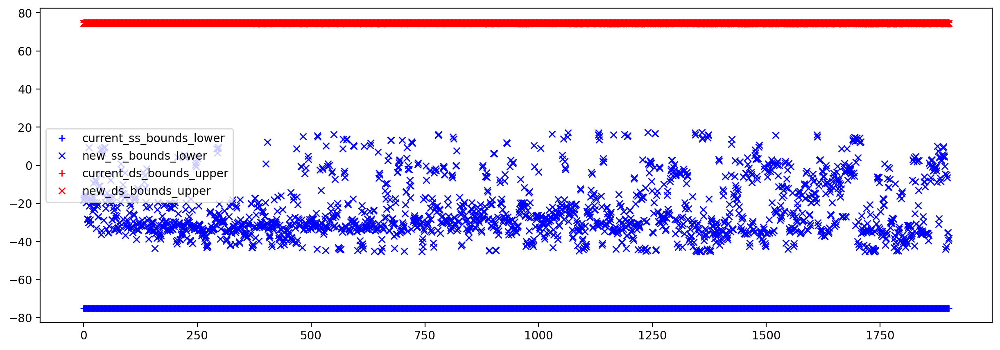

INFO: Iteration: 0, found 2863 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:17
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


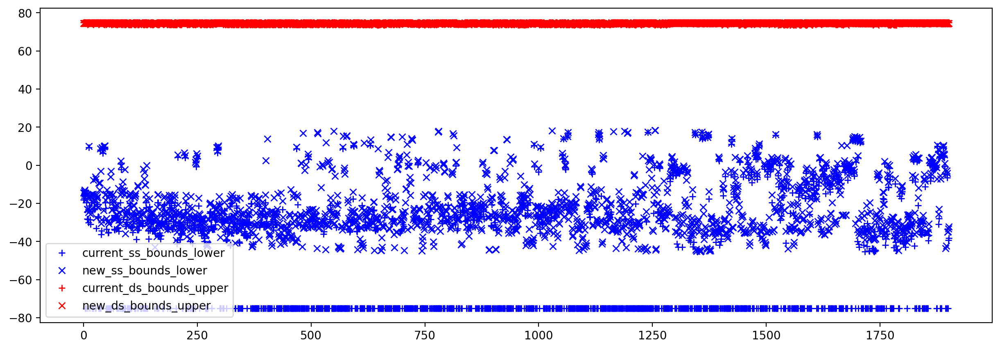

INFO: Iteration: 1, found 2695 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:18
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


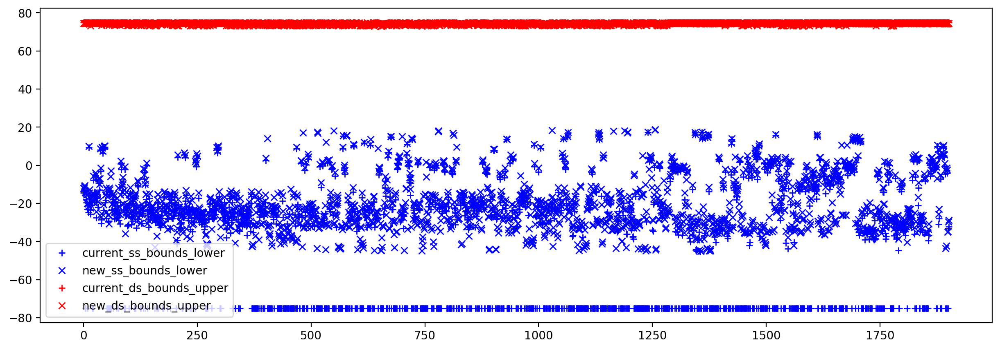

INFO: Iteration: 2, found 2560 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:19
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


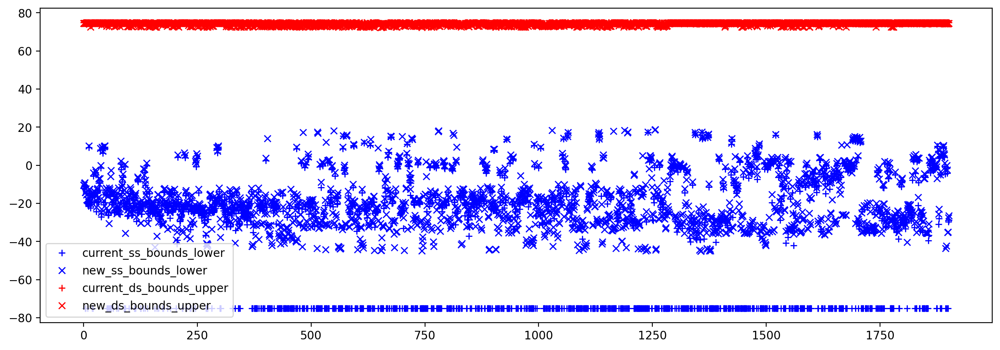

INFO: Iteration: 3, found 2528 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:21
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


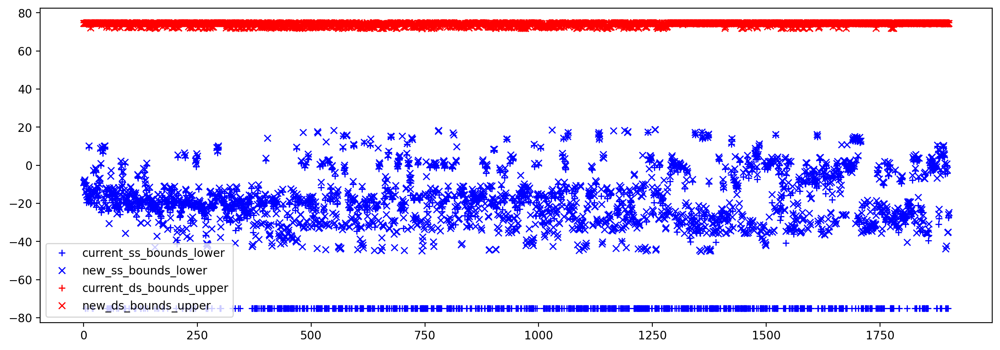

INFO: Iteration: 4, found 2493 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:22
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


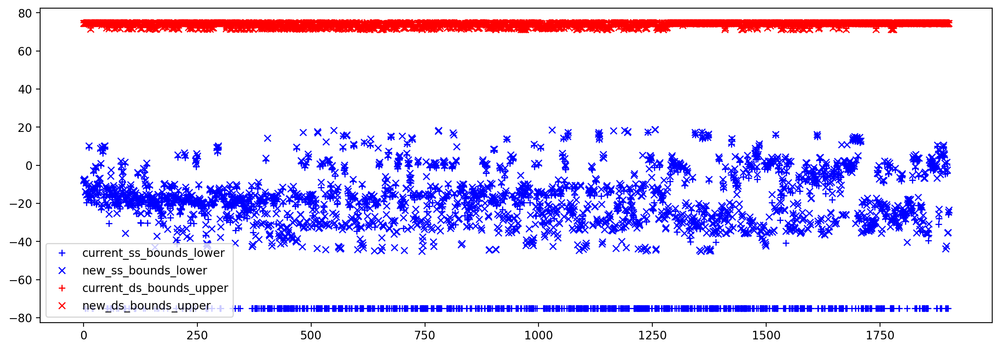

INFO: Iteration: 5, found 2453 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:23
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


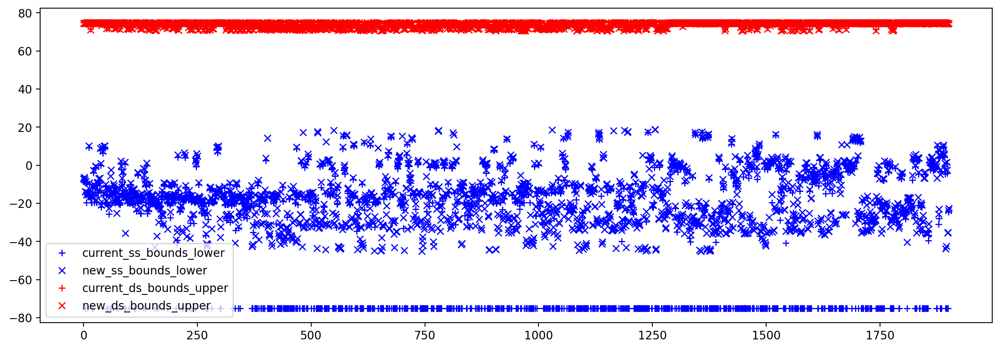

INFO: Iteration: 6, found 2421 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:24
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


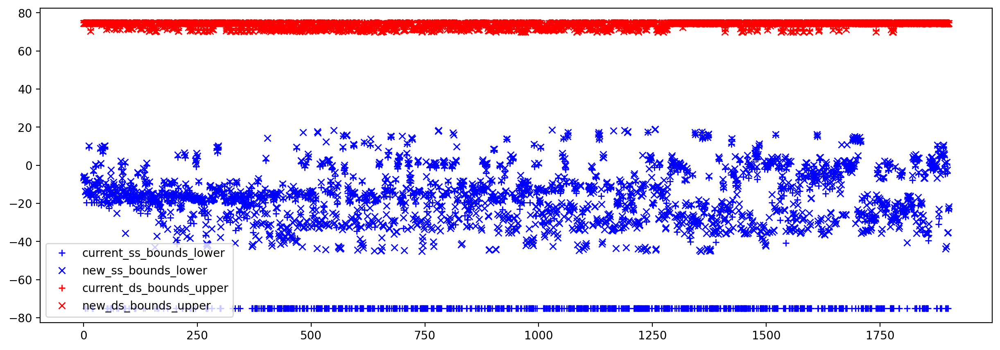

INFO: Iteration: 7, found 2409 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:25
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


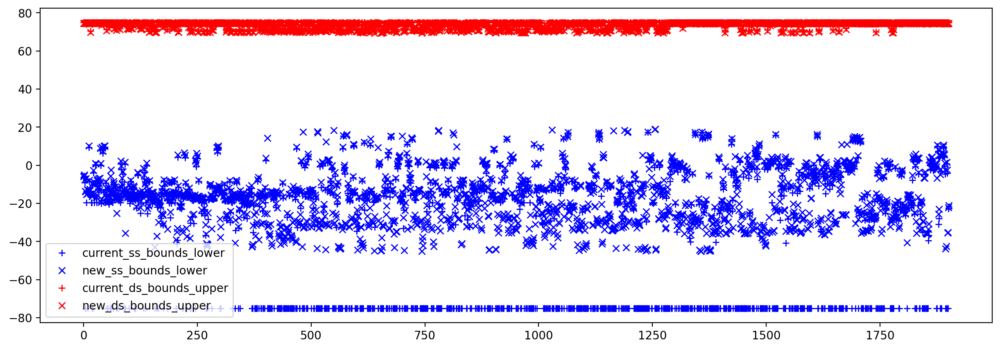

INFO: Iteration: 8, found 2400 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:26
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


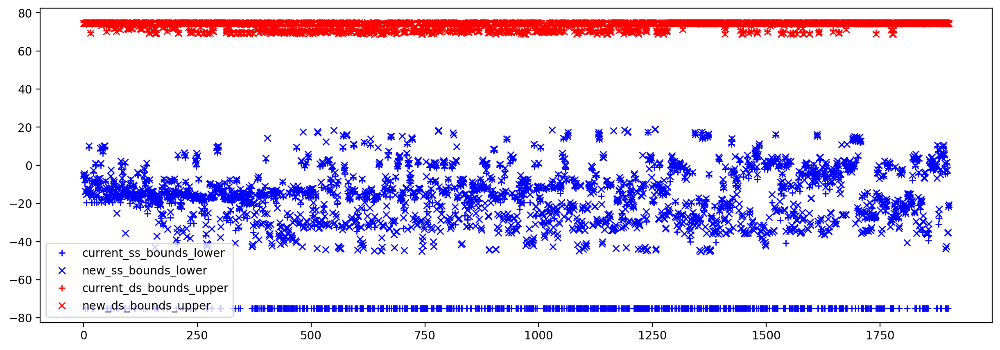

INFO: Iteration: 9, found 2411 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:27
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


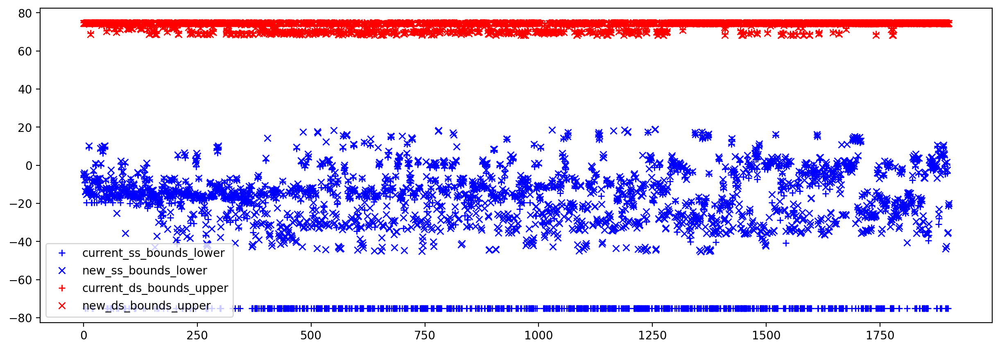

INFO: Iteration: 10, found 2405 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:29
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


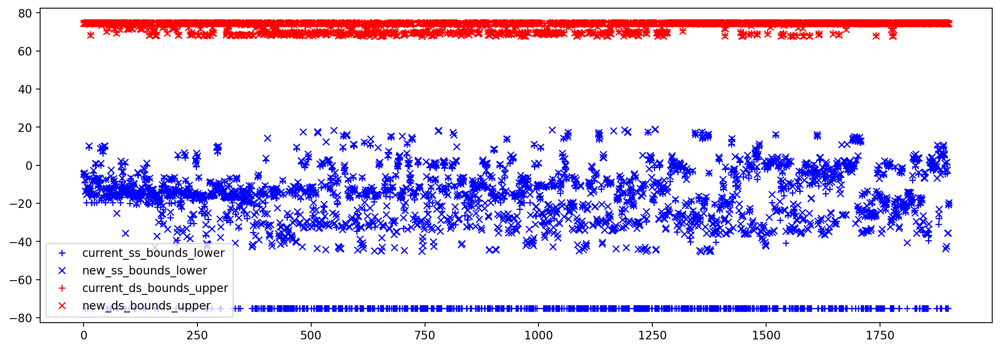

INFO: Iteration: 11, found 2386 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:30
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


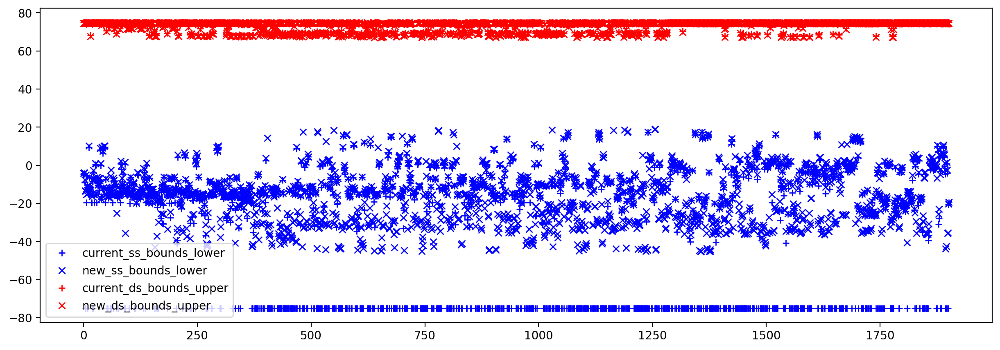

INFO: Iteration: 12, found 2374 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:31
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


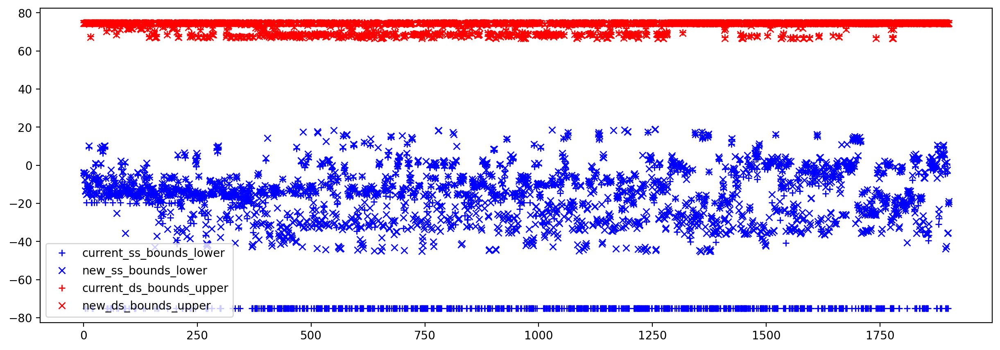

INFO: Iteration: 13, found 2363 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:32
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


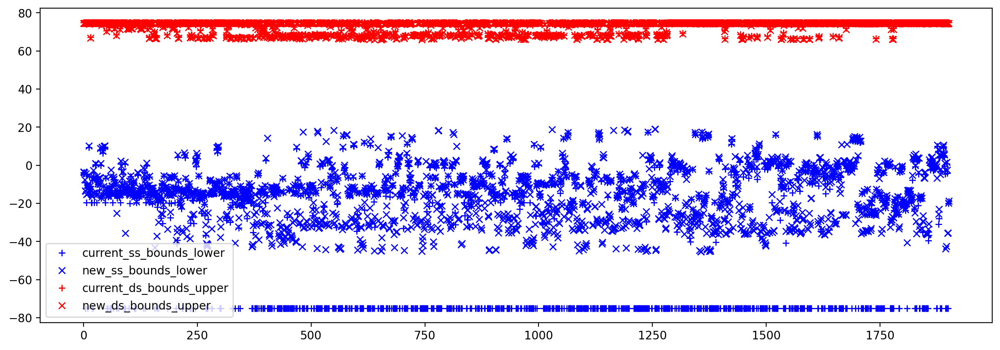

INFO: Iteration: 14, found 2359 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:33
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


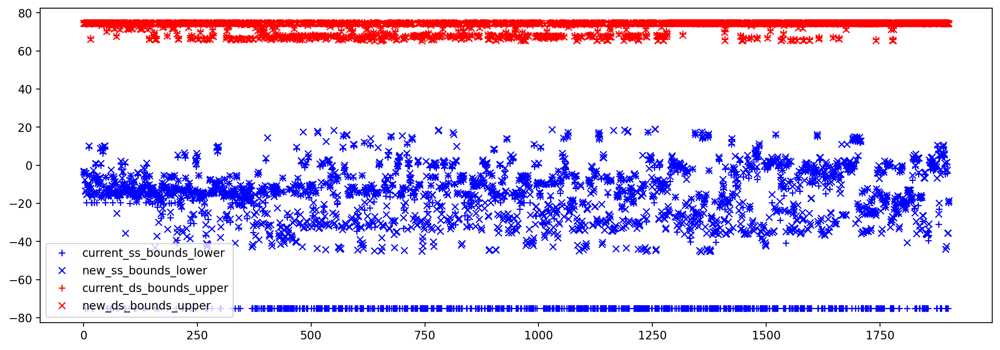

INFO: Iteration: 15, found 2367 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:34
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


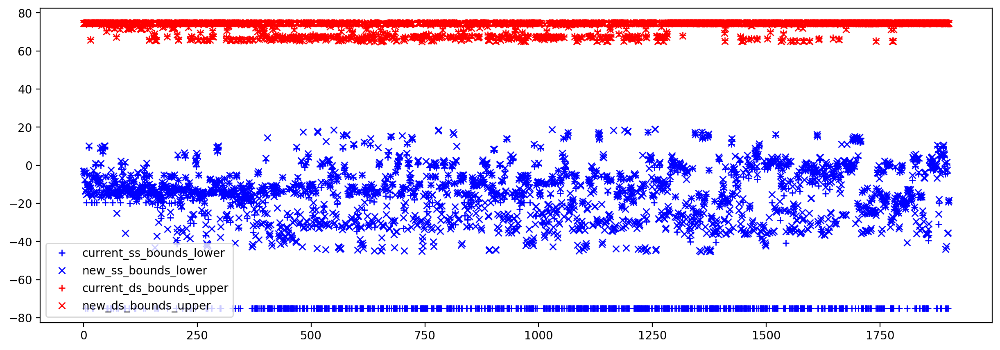

INFO: Iteration: 16, found 2362 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:35
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


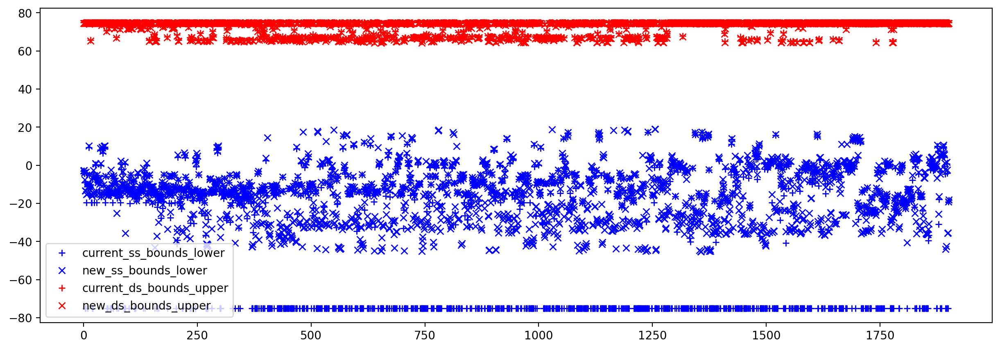

INFO: Iteration: 17, found 2353 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:36
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


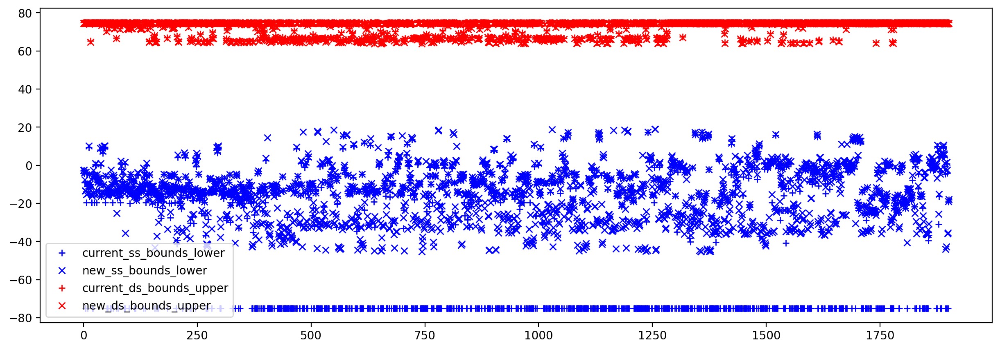

INFO: Iteration: 18, found 2348 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:38
mid_point_ss_coupling=0.5
mid_point_ds_coupling=0.5


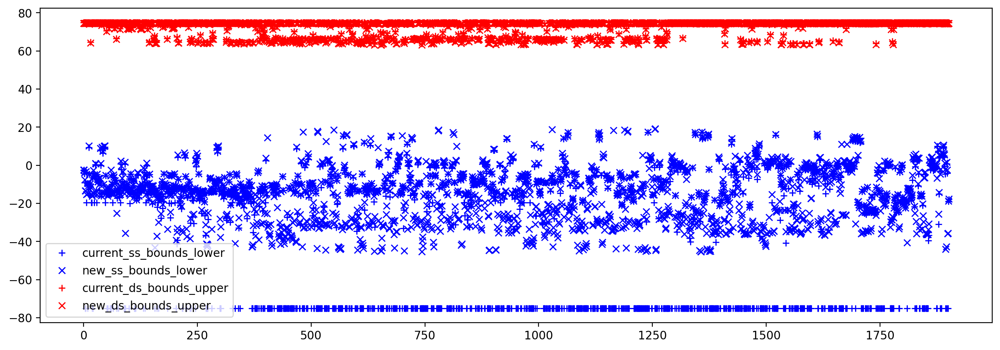

INFO: Iteration: 19, found 2335 TDEs with out of bounds coupling - __main__:<module>:54 - 2024-11-25 15:33:39


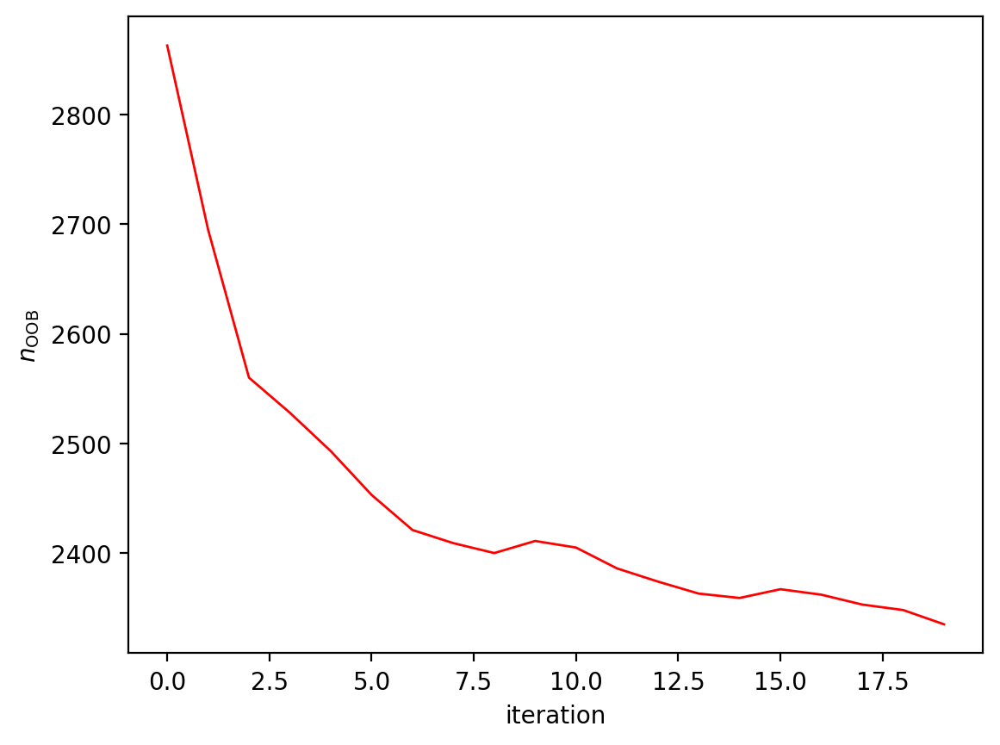

In [9]:
# Get total number of segment meshes
command.n_segment_meshes = np.max(segment.patch_file_name)

# Set tracking for each
current_ss_bounds_lower = meshes[0].qp_mesh_tde_slip_rate_lower_bound_ss * np.ones(
    meshes[0].n_tde
)
current_ss_bounds_upper = meshes[0].qp_mesh_tde_slip_rate_upper_bound_ss * np.ones(
    meshes[0].n_tde
)
current_ds_bounds_lower = meshes[0].qp_mesh_tde_slip_rate_lower_bound_ds * np.ones(
    meshes[0].n_tde
)
current_ds_bounds_upper = meshes[0].qp_mesh_tde_slip_rate_upper_bound_ds * np.ones(
    meshes[0].n_tde
)

# Start relaxation iterations
n_iter = 20
n_oob_vec = np.zeros(n_iter)
store_ss_lower = np.zeros((meshes[0].n_tde, n_iter))
store_ss_upper = np.zeros((meshes[0].n_tde, n_iter))
store_ds_lower = np.zeros((meshes[0].n_tde, n_iter))
store_ds_upper = np.zeros((meshes[0].n_tde, n_iter))
store_ss_jpl = np.zeros((meshes[0].n_tde, n_iter))
store_ss_bjm = np.zeros((meshes[0].n_tde, n_iter))
store_ds_jpl = np.zeros((meshes[0].n_tde, n_iter))
store_ds_bjm = np.zeros((meshes[0].n_tde, n_iter))


for i in range(n_iter):
    # Check bounds
    (
        continue_iterate_for_coupling_bounds,
        updated_ss_bounds_lower,
        updated_ss_bounds_upper,
        updated_ds_bounds_lower,
        updated_ds_bounds_upper,
        kinematic_tde_rates_ss,
        kinematic_tde_rates_ds,
        estimated_tde_rates_ss,
        estimated_tde_rates_ds,
        n_oob,
    ) = check_coupling_bounds_single_mesh(
        meshes,
        0,  # This is the mesh index
        estimation_qp,
        current_ss_bounds_lower,
        current_ss_bounds_upper,
        current_ds_bounds_lower,
        current_ds_bounds_upper,
        debug=False,
    )
    logger.info(f"Iteration: {i}, found {n_oob} TDEs with out of bounds coupling")

    # Store total number of OOB elements at this iteration step
    n_oob_vec[i] = n_oob

    # Build and insert update slip rate bounds into QP inequality vector
    updated_lower_bounds = -1.0 * celeri.interleave2(
        updated_ss_bounds_lower, updated_ds_bounds_lower
    )
    updated_upper_bounds = celeri.interleave2(
        updated_ss_bounds_upper, updated_ds_bounds_upper
    )
    updated_bounds = np.hstack((updated_lower_bounds, updated_upper_bounds))

    # Insert updated bounds into data vector for ineqaulity constraints
    updated_qp_inequality_constraints_data_vector = np.copy(
        qp_inequality_constraints_data_vector
    )
    updated_qp_inequality_constraints_data_vector[0 : len(updated_bounds)] = (
        updated_bounds
    )

    # QP solve with updated TDE slip rate constraints
    solution_qp = celeri.lsqlin_qp(
        operators.eigen * np.sqrt(weighting_vector_eigen[:, None]),
        data_vector_eigen * np.sqrt(weighting_vector_eigen),
        0,
        qp_inequality_constraints_matrix,  # Inequality matrix
        updated_qp_inequality_constraints_data_vector,  # Inequality data vector
        None,
        None,
        None,
        None,
        None,
        {"show_progress": False},
    )

    # Create estimation data structure and calculate derived quantities
    estimation_qp.state_vector = np.array(solution_qp["x"]).flatten()
    estimation_qp.operator = operators.eigen
    celeri.post_process_estimation_eigen(estimation_qp, operators, station, index)

    # Set *updated* to *current* for next iteration
    current_ss_bounds_lower = np.copy(updated_ss_bounds_lower)
    current_ss_bounds_upper = np.copy(updated_ss_bounds_upper)
    current_ds_bounds_lower = np.copy(updated_ds_bounds_lower)
    current_ds_bounds_upper = np.copy(updated_ds_bounds_upper)

    # Store values for understanding
    store_ss_lower[:, i] = current_ss_bounds_lower
    store_ss_upper[:, i] = current_ss_bounds_upper
    store_ds_lower[:, i] = current_ds_bounds_lower
    store_ds_upper[:, i] = current_ds_bounds_upper
    store_ss_bjm[:, i] = estimation_qp.tde_strike_slip_rates[0 : meshes[0].n_tde]
    store_ds_bjm[:, i] = estimation_qp.tde_dip_slip_rates[0 : meshes[0].n_tde]
    store_ss_jpl[:, i] = kinematic_tde_rates_ss
    store_ds_jpl[:, i] = kinematic_tde_rates_ds


# Plot convergence
plt.figure()
plt.plot(n_oob_vec, "-r", linewidth=1.0)
plt.xlabel("iteration")
plt.ylabel("$n_\mathrm{OOB}$")
plt.show()

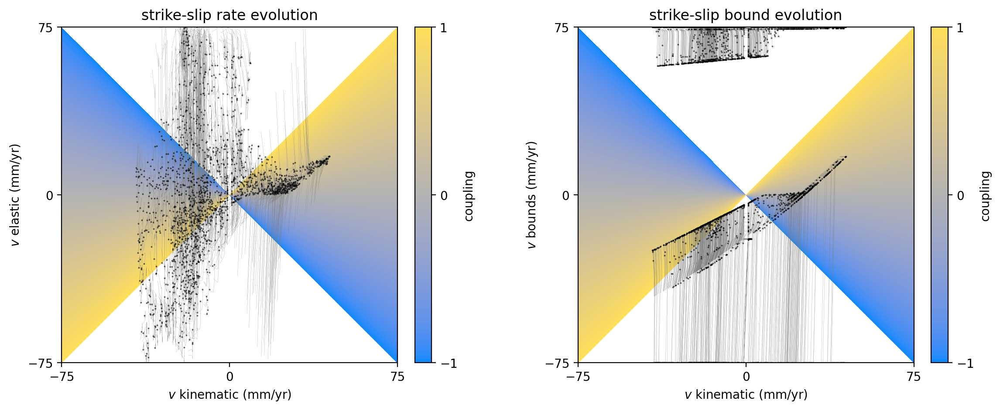

In [10]:
# iters = np.array(range(len(store_ss_jpl[0, :])))
n = meshes[0].n_tde

levels = 101
j_cutoff = 50.0
j = np.linspace(-100, 100, 1000)
b = np.linspace(-100, 100, 1000)
j_grid, b_grid = np.meshgrid(j, b)
j_grid_orig = np.copy(j_grid)
b_grid_orig = np.copy(b_grid)
coupling_grid = b_grid / (j_grid)
coupling_grid[coupling_grid > 1.0] = np.nan
coupling_grid[coupling_grid < -1.0] = np.nan

plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.contourf(j_grid_orig, b_grid_orig, coupling_grid, cmap=cc.m_CET_CBD2, levels=levels)
plt.colorbar(label="coupling", fraction=0.046, pad=0.04, ticks=[-1.0, 0.0, 1.0])

for i in range(n):
    plt.plot(
        store_ss_jpl[i, :],
        store_ss_bjm[i, :],
        "-",
        linewidth=0.1,
        color="gray",
        zorder=1,
    )
plt.plot(store_ss_jpl[:, -1], store_ss_bjm[:, -1], ".k", markersize=0.5)
plt.xlim([-75, 75])
plt.ylim([-75, 75])
plt.xticks([-75, 0, 75])
plt.yticks([-75, 0, 75])
plt.gca().set_aspect("equal")
plt.xlabel("$v$ kinematic (mm/yr)")
plt.ylabel("$v$ elastic (mm/yr)")
plt.title("strike-slip rate evolution")

plt.subplot(1, 2, 2)
plt.contourf(j_grid_orig, b_grid_orig, coupling_grid, cmap=cc.m_CET_CBD2, levels=levels)
plt.colorbar(label="coupling", fraction=0.046, pad=0.04, ticks=[-1.0, 0.0, 1.0])

for i in range(n):
    plt.plot(
        store_ss_jpl[i, :],
        store_ss_lower[i, :],
        "-",
        linewidth=0.1,
        color="gray",
        zorder=1,
    )
    plt.plot(
        store_ss_jpl[i, :],
        store_ss_upper[i, :],
        "-",
        linewidth=0.1,
        color="gray",
        zorder=1,
    )
plt.plot(store_ss_jpl[:, -1], store_ss_lower[:, -1], ".k", markersize=0.5)
plt.plot(store_ss_jpl[:, -1], store_ss_upper[:, -1], ".k", markersize=0.5)
plt.xlim([-75, 75])
plt.ylim([-75, 75])
plt.xticks([-75, 0, 75])
plt.yticks([-75, 0, 75])
plt.gca().set_aspect("equal")
plt.xlabel("$v$ kinematic (mm/yr)")
plt.ylabel("$v$ bounds (mm/yr)")
plt.title("strike-slip bound evolution")

plt.show()

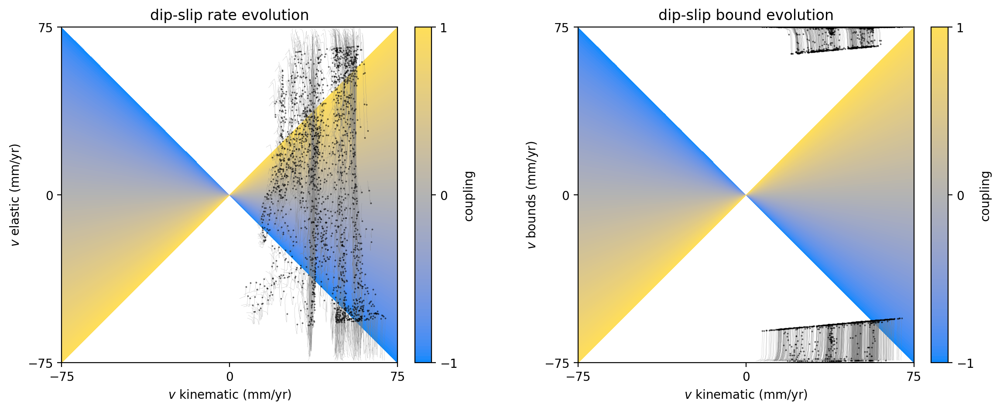

In [11]:
# iters = np.array(range(len(store_ss_jpl[0, :])))
n = meshes[0].n_tde

levels = 101
j_cutoff = 50.0
j = np.linspace(-100, 100, 1000)
b = np.linspace(-100, 100, 1000)
j_grid, b_grid = np.meshgrid(j, b)
j_grid_orig = np.copy(j_grid)
b_grid_orig = np.copy(b_grid)
coupling_grid = b_grid / (j_grid)
coupling_grid[coupling_grid > 1.0] = np.nan
coupling_grid[coupling_grid < -1.0] = np.nan

plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.contourf(j_grid_orig, b_grid_orig, coupling_grid, cmap=cc.m_CET_CBD2, levels=levels)
plt.colorbar(label="coupling", fraction=0.046, pad=0.04, ticks=[-1.0, 0.0, 1.0])

for i in range(n):
    plt.plot(
        store_ds_jpl[i, :],
        store_ds_bjm[i, :],
        "-",
        linewidth=0.1,
        color="gray",
        zorder=1,
    )
plt.plot(store_ds_jpl[:, -1], store_ds_bjm[:, -1], ".k", markersize=0.5)
plt.xlim([-75, 75])
plt.ylim([-75, 75])
plt.xticks([-75, 0, 75])
plt.yticks([-75, 0, 75])
plt.gca().set_aspect("equal")
plt.xlabel("$v$ kinematic (mm/yr)")
plt.ylabel("$v$ elastic (mm/yr)")
plt.title("dip-slip rate evolution")

plt.subplot(1, 2, 2)
plt.contourf(j_grid_orig, b_grid_orig, coupling_grid, cmap=cc.m_CET_CBD2, levels=levels)
plt.colorbar(label="coupling", fraction=0.046, pad=0.04, ticks=[-1.0, 0.0, 1.0])

for i in range(n):
    plt.plot(
        store_ds_jpl[i, :],
        store_ds_lower[i, :],
        "-",
        linewidth=0.1,
        color="gray",
        zorder=1,
    )
    plt.plot(
        store_ds_jpl[i, :],
        store_ds_upper[i, :],
        "-",
        linewidth=0.1,
        color="gray",
        zorder=1,
    )
plt.plot(store_ds_jpl[:, -1], store_ds_lower[:, -1], ".k", markersize=0.5)
plt.plot(store_ds_jpl[:, -1], store_ds_upper[:, -1], ".k", markersize=0.5)
plt.xlim([-75, 75])
plt.ylim([-75, 75])
plt.xticks([-75, 0, 75])
plt.yticks([-75, 0, 75])
plt.gca().set_aspect("equal")
plt.xlabel("$v$ kinematic (mm/yr)")
plt.ylabel("$v$ bounds (mm/yr)")
plt.title("dip-slip bound evolution")

plt.show()

# Plot complete model result after coupling iterations

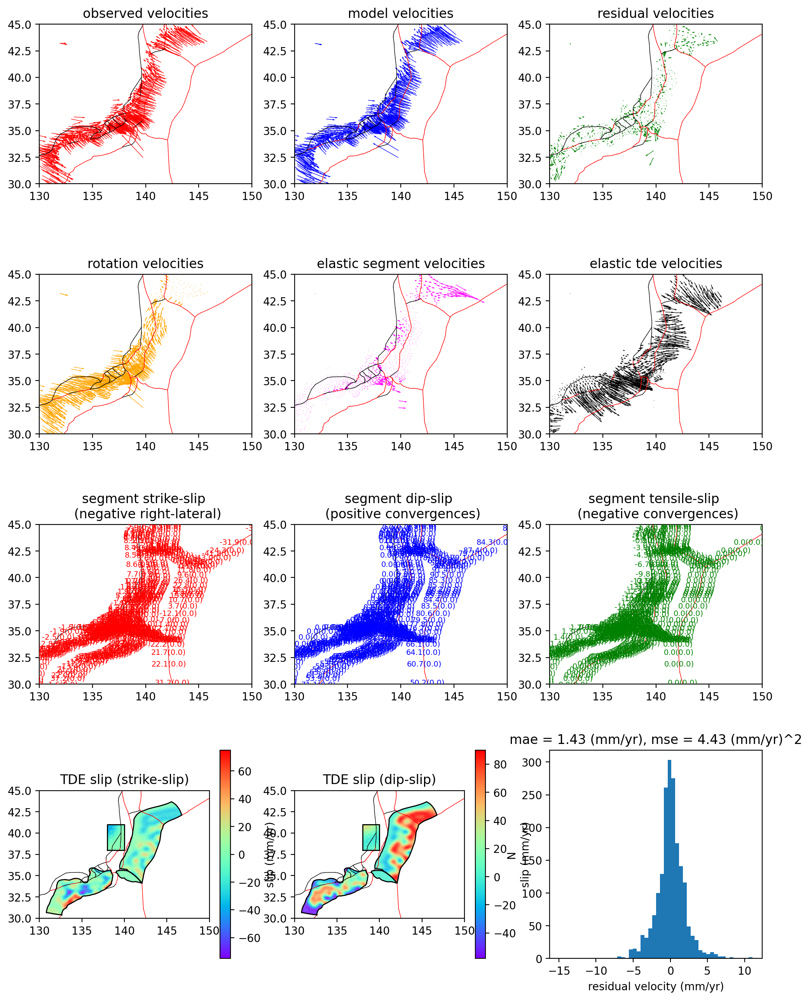

SUCCESS: Wrote figures../runs/0000000650/plot_estimation_summary.(pdf, png) - celeri.celeri:plot_estimation_summary:6601 - 2024-11-25 15:33:51


<Figure size 640x480 with 0 Axes>

In [12]:
celeri.plot_estimation_summary(
    command,
    segment,
    station,
    meshes,
    estimation_qp,
    lon_range=command.lon_range,
    lat_range=command.lat_range,
    quiver_scale=command.quiver_scale,
)

# Plot final slip rates and coupling distributions

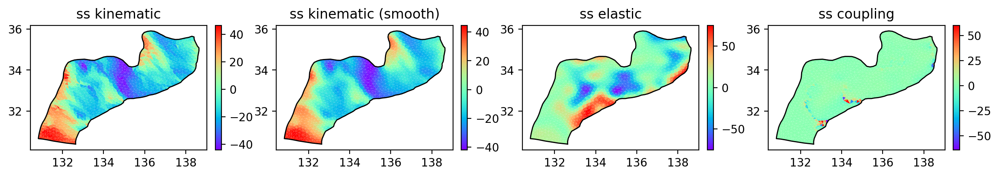

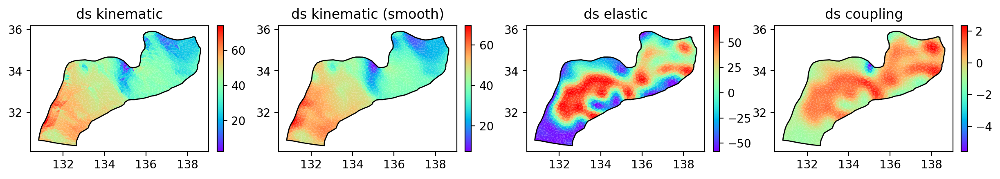

In [13]:
# Multiply rotation vector components by TDE slip rate partials
kinematic = (
    operators.rotation_to_tri_slip_rate[0]
    @ estimation_qp.state_vector[0 : 3 * len(block)]
)

# Multiply eigen modes by eigen to TDE matrix
elastic = (
    operators.eigenvectors_to_tde_slip[0]
    @ estimation_qp.state_vector[
        3 * len(block) : 3 * len(block)
        + meshes[0].n_modes_strike_slip
        + meshes[0].n_modes_dip_slip
    ]
)


# Calculate final coupling and smoothed kinematic
tde_coupling_ss, kinematic_tde_rates_ss_smooth = get_coupling(
    meshes[0].lon_centroid,
    meshes[0].lat_centroid,
    elastic[0::2],
    kinematic[0::2],
    smoothing_length_scale=0.1,
    kinematic_slip_regularization_scale=1.0,
)

tde_coupling_ds, kinematic_tde_rates_ds_smooth = get_coupling(
    meshes[0].lon_centroid,
    meshes[0].lat_centroid,
    elastic[1::2],
    kinematic[1::2],
    smoothing_length_scale=0.1,
    kinematic_slip_regularization_scale=1.0,
)


# Strike-slip
plt.figure(figsize=(15, 2))
plt.subplot(1, 4, 1)
plot_mesh(meshes[0], kinematic[0::2], plt.gca())
plt.title("ss kinematic")

plt.subplot(1, 4, 2)
plot_mesh(meshes[0], kinematic_tde_rates_ss_smooth, plt.gca())
plt.title("ss kinematic (smooth)")

plt.subplot(1, 4, 3)
plot_mesh(meshes[0], elastic[0::2], plt.gca())
plt.title("ss elastic")

plt.subplot(1, 4, 4)
plot_mesh(meshes[0], tde_coupling_ss, plt.gca())
plt.title("ss coupling")
plt.show()


# Dip-slip
plt.figure(figsize=(15, 2))
plt.subplot(1, 4, 1)
plot_mesh(meshes[0], kinematic[1::2], plt.gca())
plt.title("ds kinematic")

plt.subplot(1, 4, 2)
plot_mesh(meshes[0], kinematic_tde_rates_ds_smooth, plt.gca())
plt.title("ds kinematic (smooth)")

plt.subplot(1, 4, 3)
plot_mesh(meshes[0], elastic[1::2], plt.gca())
plt.title("ds elastic")

plt.subplot(1, 4, 4)
plot_mesh(meshes[0], tde_coupling_ds, plt.gca())
plt.title("ds coupling")

plt.show()